# Hotel Recommender / HotelWatch System: Exploratory Data Analysis

Hotel Recommender/HotelWatch System is a RAG-LLM powered AI agent that analyze guest-based hotel reviews. Just like a coin and every single thing in life, this entity has two opposing sides at the same time.

Depending on which side are you on, it might be a Hotel Recommender or a HotelWatch for you. As a Hotel Recommender System, it recommends its' users a selection of hotels to pick for, based on the user's travel location, preference, and nationality as feature selections.

1. Location gives information relevancy, since the user can adjust the system accordingly with one's interest and activities. 

2. Preference lends personalization insight, enabling the user to seek specific preference in a hotel.

3. Nationality as a (stereotypical) cultural knowledge, where users can find similar cultural perspectives on specific hospitality aspect.

For hoteliers, this system is a Foucauldian panopticon (surveillance apparatus; Imagine a 24-hour CCTV) that watches and seeks to reproduce specific attitude (Bourdieusian's Habitus), effectively serving a disciplinary tool for them. It also serves as the guest's means to punish or reinforce specific hospitality acts via reviews, although it is not uncommon for hoteliers to gamify this system with promos, discounts, compliments, and other means to look good in front of this system.

### What insights can you get from this system (exploratory data analysis)?

This system answers three questions:

1. In regards of location, what countries and regions are covered by this system?

2. In regards of general preference, which regions are considered good for staying, and why?

3. In regards of nationality, from which cultural perspectives does this review came from?

## Table of Content

*1. Descriptive Statistic Analysis*

*2. General Exploratory Data Analysis*

*3. Regional Exploratory Data Analysis*

*4. Review Exploratory Data Analysis*

*5. Hotel Recommender/HotelWatch Training Data*

## Descriptive Statistic Analysis

Basic due dilligence.

In [1]:
def load_data():
    import pandas as pd

    df = pd.read_csv('Hotel_Reviews.csv')
    return df

df = load_data()
df.sample(5)

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng
460229,Staalmeesterslaan 410 Slotervaart 1057 PH Amst...,926,12/15/2015,8.2,Ramada Apollo Amsterdam Centre,United Kingdom,Room could have been cleaner I was travelling...,84,5770,Views from the room were amazing The beds wer...,40,1,7.5,"[' Leisure trip ', ' Family with young childre...",597 day,52.368130,4.844085
346179,Hoogoorddreef 1 Zuidoost 1101 BA Amsterdam Net...,237,9/5/2015,8.4,Courtyard by Marriott Amsterdam Arena Atlas,Austria,We had took out two rooms and both of them yo...,41,2179,I would say it s my favourite hotel in Amster...,23,10,9.6,"[' Leisure trip ', ' Family with older childre...",698 day,52.310118,4.947292
247128,8 14 Talbot Sq Paddington Westminster Borough ...,102,12/8/2016,8.6,Mercure London Hyde Park,Austria,The breakfast room was very cramped,7,527,The rooms were newly renovated,6,2,8.8,"[' Leisure trip ', ' Group ', ' Standard King ...",238 day,51.515115,-0.174386
268480,Am Hof 2 01 Innere Stadt 1010 Vienna Austria,82,7/19/2016,9.3,Park Hyatt Vienna,United Kingdom,1 The hotel and or booking com lied about the...,175,532,The hotel environment is brand new beautifull...,93,20,9.2,"[' Business trip ', ' Family with older childr...",380 day,48.210524,16.368359
428238,Rennweg 16 03 Landstra e 1030 Vienna Austria,370,4/23/2017,8.9,Austria Trend Hotel Savoyen Vienna,Germany,The reservation process through Bookings com ...,92,4016,The front desk and breakfast room staff were ...,43,7,10.0,"[' Leisure trip ', ' Group ', ' Deluxe Room ',...",102 day,48.195044,16.384475


Here's a quick explanation on the dataset.

    Hotel_Address: Address of hotel.

    Review_Date: Date when reviewer posted the corresponding review.

    Average_Score: Average Score of the hotel, calculated based on the latest comment in the last year.

    Hotel_Name: Name of Hotel

    Reviewer_Nationality: Nationality of Reviewer

    Negative_Review: Negative Review the reviewer gave to the hotel. If the reviewer does not give the negative review, then it should be: 'No Negative'

    Review_Total_Negative_Word_Counts: Total number of words in the negative review.

    Positive_Review: Positive Review the reviewer gave to the hotel. If the reviewer does not give the negative review, then it should be: 'No Positive'

    Review_Total_Positive_Word_Counts: Total number of words in the positive review.

    Reviewer_Score: Score the reviewer has given to the hotel, based on his/her experience

    Total_Number_of_Reviews_Reviewer_Has_Given: Number of Reviews the reviewers has given in the past.

    Total_Number_of_Reviews: Total number of valid reviews the hotel has.

    Tags: Tags reviewer gave the hotel.

    days_since_review: Duration between the review date and scrape date.

    Additional_Number_of_Scoring: There are also some guests who just made a scoring on the service rather than a review. This number indicates how many valid scores without review in there.

    lat: Latitude of the hotel
    
    lng: longtitude of the hotel

Let's just simplify the dataset further - we don't really need all of them.

In [2]:
def ETL(df):
    import pandas as pd
    from datetime import datetime

    df = df.drop(columns = ['Review_Total_Negative_Word_Counts', 'Review_Total_Positive_Word_Counts', 'Total_Number_of_Reviews_Reviewer_Has_Given', 'Total_Number_of_Reviews', 'Additional_Number_of_Scoring', 'Average_Score', 'lat', 'lng'])

    #days_since_review has "days" in it, so needs to be cleaned first
    df['days_since_review'] = df['days_since_review'].str.replace(r'( day| days|s)', '', regex = True).astype(int)

    df['Review_Date'] = pd.to_datetime(df['Review_Date'])
    df['days_since_review'] = (datetime.now() - df['Review_Date']).dt.days
    df['Hotel_Name'] = df['Hotel_Name'].str.replace('H tel', 'Hotel') #typos

    return df

df = ETL(df)
df.sample(5)

,Hotel_Address,Review_Date,Hotel_Name,Reviewer_Nationality,Negative_Review,Positive_Review,Reviewer_Score,Tags,days_since_review
280793,Avinguda Catedral 7 Ciutat Vella 08002 Barcelo...,2017-02-27,Col n Hotel Barcelona,Taiwan,No Negative,Good location and romantic atomsphere just fa...,10.0,"[' Leisure trip ', ' Family with young childre...",2658
386214,Nieuwezijds Voorburgwal 67 Amsterdam City Cent...,2017-07-28,INK Hotel Amsterdam MGallery by Sofitel,United Kingdom,Would have preferred the all of the bathroom ...,The hotel was in a good location with everyth...,7.9,"[' Leisure trip ', ' Couple ', ' Superior King...",2507
22635,10 Wardour Street Leicester Square Westminster...,2017-02-20,W London Leicester Square,United Kingdom,A poor take on what the potential futuristic ...,No Positive,5.8,"[' Leisure trip ', ' Couple ', ' Wonderful Roo...",2665
259968,9 rue Git le Coeur 6th arr 75006 Paris France,2015-09-12,Relais Hotel du Vieux Paris,New Zealand,No Negative,Great location The staff Immaculately clean H...,10.0,"[' Leisure trip ', ' Couple ', ' Executive Dou...",3192
104096,21 Gower Street Camden London WC1E 6HG United ...,2016-11-08,The Academy,United Kingdom,No Negative,Centrally located Room was fabulous very comf...,10.0,"[' Leisure trip ', ' Couple ', ' Double Room '...",2769


This is the simplified version of this dataset:

`Hotel_Address` is important because this dataset concerns with hotels from different regions and countries. Analyzing the whole dataset is an over-generalization that brings less analytic values, so these columns will bring context into analysis. Note that I choose to drop `lat` and `lng` here; You'll see why later on.

`days_since_review` gives relevancy to inform users on recent phenomenon.

`Reviewer_Nationality` is another analytic context. Since it is impossible to follow every individual's perspective, nationality brings a generalized analytic context to understand guests' expectation.

`Negative_Review`, `Positive_Review`, and `Reviewer_Score` are the core of analysis. This enables us to see the perspective of guests in particular hotel, region, and/or country, depending on what analysis to conduct.

`Tags` gives detailed explanation on why a specific review holds a particular perspective.

However, I'd like to bring `days_since_review` to your attention. This column is treated as categorical data because it has "days" (e.g. 3 days) in its' value, and this will hinder our analysis. This is why I preprocessed this column first before proceeding further, and update it to current date of analysis (today).

In [3]:
def descriptive_statistics(df):
    import pandas as pd
    import scipy.stats as stats
    
    pd.options.display.float_format = '{:.2f}'.format
    pd.options.display.max_colwidth = 100

    def describe_data(df, dtype):
        data = df.select_dtypes(include=[dtype])

        if dtype == 'number':
            Q1 = data.quantile(0.25)
            Q3 = data.quantile(0.75)
            IQR = Q3 - Q1
            upper_bound = Q3 + 1.5 * IQR
            lower_bound = Q1 - 1.5 * IQR
            
            description = data.describe().loc[[]].T.assign(
                Mean = data.mean(),
                MAD = stats.median_abs_deviation(data, nan_policy='omit'), #Mean Absolute Deviation
                Median = data.median(),
                STD = data.std(),
                Mode = data.mode().T[0],
                Variance = data.var(),
                Min = data.min(),
                Max = data.max(),
                Kurtosis = data.kurtosis(),
                Skew = data.skew(),
                IQR = IQR,
                Lower_bound = lower_bound,
                Upper_bound = upper_bound,
                Upper_Outliers = (data > upper_bound).sum(),
                Lower_Outliers = (data < lower_bound).sum(),
                Missing = data.isnull().sum(),
                Null_Values = (data == 0).sum(),
                Count = data.count()
            )

        else:
            description = data.describe().loc[[]].T.assign(
                Count = data.count(),
                Unique = data.nunique(),
                NotUnique = data.count() - data.nunique(),
                Missing = data.isnull().sum(),
                Miss_Percent= data.apply(lambda x: ((len(x) - x.count())/len(x)) * 100),
                Most_Frequent_Data = data.mode().T[0]
            )
            
        print(f'\n----------{dtype.capitalize()} Data----------')
        print('Columns: ', data.shape[1])
        print(description)

    describe_data(df, 'object')
    describe_data(df, 'number')

descriptive_statistics(df)


----------Object Data----------
Columns:  6
                       Count  Unique  NotUnique  Missing  Miss_Percent  \
Hotel_Address         515738    1493     514245        0          0.00   
Hotel_Name            515738    1491     514247        0          0.00   
Reviewer_Nationality  515738     227     515511        0          0.00   
Negative_Review       515738  330011     185727        0          0.00   
Positive_Review       515738  412601     103137        0          0.00   
Tags                  515738   55242     460496        0          0.00   

                                                                                                       Most_Frequent_Data  
Hotel_Address                                        163 Marsh Wall Docklands Tower Hamlets London E14 9SJ United Kingdom  
Hotel_Name                                                                     Britannia International Hotel Canary Wharf  
Reviewer_Nationality                                            

In quick-bullets style, this dataset has:

1. ***515738*** Rows with ***0*** `null_values` and ***0*** missing values for most columns, except for `days_since_review` that has ***855*** `null_values`.

2. In categorical data, there are ***1492*** hotels (with weirdly ***1493*** `Hotel_Address`) with ***185727*** "no negative" `Negative_Review` and ***103137*** "no positive" `Positive_Review` out of ***515738*** total reviews. These reviews were written by guests from ***227*** `Reviewer_Nationality`, represented in ***55242*** unique `Tags`.

4. In numerical data values, `Reviewer_Score` has `Mean` of ***8.40*** with ***1.20*** `Mean Absolute Deviance`, `Median` of ***8.00*** with ***1.64*** `Standard Deviation` and ***2.68*** `Variance`, as well as `Minimum Value` of ***2.50*** with ***10.00*** `Max Value` and `Mode`. This is quite normal, but the same cannot be said for `days_since_review`. 

5. `days_since_review` has `Mean` value ***354.44***, along with `Mean Absolute Deviance` of **176.00**. This indicates a wild variability in this column; ***0*** `Min`, ***739*** `Max`, a `Mode` of ***1***, and **43650.96** `Variance` reinforce this indication further, but I'll hold my judgement before seeing its' data distribution.

6. In numerical data distribution, `Reviewer_Score` has ***15907*** `Lower_Outliers` with ***4.35*** `Lower_Bound` and ***0*** `Upper_Outliers`. It also has ***0.97*** (*Fisher's, or -3*) `Kurtosis` and ***-1.19*** `Skew`, which means the data skews ever so slightly to the left. In other words, guests tend to give the hotels a good remarks, in this case around 8.4 (the `Mean` value) to 10, but not by **that** much.

7. `days_since_review`, on the other hand, has 0 `Lower_Outliers` and `Upper_Outliers`, complemented with absolutely normal ***0.06*** `skew` and somewhat-short tailed ***-1.13*** `kurtosis`. This means most data is relevant, and I won't delete any data for this reason only.

One noteworthy phenomenon here is the `Mode` of ***10.00*** for `reviewer_score`, which I called "the 10-points-or-5-stars review" phenomenon. Unlike hips, perfect score do lie about 'expectation' and 'perfection'; The two has qualitatively distinctive meaning, but somehow generalized in "10.00 points". 

Nevertheless, let's save this talk for qualitative inquiry later - Shoutout to Shakira!

In [4]:
def single_histogram(data, nbins, title, x_label, y_label):
    import plotly.graph_objects as go

    fig = go.Figure(data=[go.Histogram(x=data, nbinsx=nbins)], layout=go.Layout(bargap=0.2))
    fig.update_layout(
        title_text=title, # title of plot
        xaxis_title_text=x_label, # xaxis label
        yaxis_title_text=y_label, # yaxis label
    )
    fig.show()

In [5]:
single_histogram(df['Reviewer_Score'], 20, 'Reviewer Score Distribution', 'Reviewer Score', 'Frequency')
single_histogram(df['days_since_review'], 20, 'Days Since Review Distribution', 'Days Since Review', 'Frequency')

It's an old dataset, I know.

### Categorizing Reviewer_Score (Binning)

Since there is 500k-ish of data that represents 1492 hotels, we can use descriptive statistics to bin the data.

1. Any `Reviewer_Scores` that sits below the ***4.35*** `Lower_bound`, also called `Lower_outliers`, are binned as ***Abysmal***. As shown above, there are ***15907*** reviews here, and we're about to see how bad it is.

2. `Reviewer_Scores` that has above Abysmal value but below ***7.20***, essentially the `Mean` subtracted by `Mean Absolute Deviation`, is ***Unsatisfactory***.

3. `Reviewer_Scores` between Unsatisfactory and the `Mean` value of ***8.40*** is regarded ***Satisfactory***.

4. Finally, a review is considered ***Distinguished*** if its' `Reviewer_Score` exceeds Satisfactory and below the `Mean` value added by `Mean Absolute Value`, in this case ***9.60***. Everything beyond that regarded as ***Excellence***.

In [6]:
def binning(df):
    import pandas as pd
    
    bins = [0, 4.35, 7.20, 8.40, 9.60, 10] 
    labels = ['Abysmal', 'Unsatisfactory', 'Satisfactory', 'Distinguished', 'Excellence'] 

    # Convert the ordinal data into categorical data
    df['Score_Category'] = pd.cut(df['Reviewer_Score'], bins=bins, labels=labels)

    #Rearranging the columns
    cols = df.columns.tolist()
    cols.insert(cols.index('Reviewer_Score'), cols.pop(cols.index('Tags')))
    df = df[cols]

    return df

df = binning(df)
df.head(5)

,Hotel_Address,Review_Date,Hotel_Name,Reviewer_Nationality,Negative_Review,Positive_Review,Tags,Reviewer_Score,days_since_review,Score_Category
0,s Gravesandestraat 55 Oost 1092 AA Amsterdam Netherlands,2017-08-03,Hotel Arena,Russia,I am so angry that i made this post available via all possible sites i use when planing my trip...,Only the park outside of the hotel was beautiful,"[' Leisure trip ', ' Couple ', ' Duplex Double Room ', ' Stayed 6 nights ']",2.90,2501,Abysmal
1,s Gravesandestraat 55 Oost 1092 AA Amsterdam Netherlands,2017-08-03,Hotel Arena,Ireland,No Negative,No real complaints the hotel was great great location surroundings rooms amenities and service ...,"[' Leisure trip ', ' Couple ', ' Duplex Double Room ', ' Stayed 4 nights ']",7.50,2501,Satisfactory
2,s Gravesandestraat 55 Oost 1092 AA Amsterdam Netherlands,2017-07-31,Hotel Arena,Australia,Rooms are nice but for elderly a bit difficult as most rooms are two story with narrow steps So...,Location was good and staff were ok It is cute hotel the breakfast range is nice Will go back,"[' Leisure trip ', ' Family with young children ', ' Duplex Double Room ', ' Stayed 3 nights ', ...",7.10,2504,Unsatisfactory
3,s Gravesandestraat 55 Oost 1092 AA Amsterdam Netherlands,2017-07-31,Hotel Arena,United Kingdom,My room was dirty and I was afraid to walk barefoot on the floor which looked as if it was not ...,Great location in nice surroundings the bar and restaurant are nice and have a lovely outdoor a...,"[' Leisure trip ', ' Solo traveler ', ' Duplex Double Room ', ' Stayed 3 nights ']",3.80,2504,Abysmal
4,s Gravesandestraat 55 Oost 1092 AA Amsterdam Netherlands,2017-07-24,Hotel Arena,New Zealand,You When I booked with your company on line you showed me pictures of a room I thought I was ge...,Amazing location and building Romantic setting,"[' Leisure trip ', ' Couple ', ' Suite ', ' Stayed 2 nights ', ' Submitted from a mobile device ']",6.70,2511,Unsatisfactory


Aha! Lucky me to find this right away.

In [7]:
df.loc[2]

Hotel_Address                                                      s Gravesandestraat 55 Oost 1092 AA Amsterdam Netherlands
Review_Date                                                                                             2017-07-31 00:00:00
Hotel_Name                                                                                                      Hotel Arena
Reviewer_Nationality                                                                                             Australia 
Negative_Review          Rooms are nice but for elderly a bit difficult as most rooms are two story with narrow steps So...
Positive_Review              Location was good and staff were ok It is cute hotel the breakfast range is nice Will go back 
Tags                    [' Leisure trip ', ' Family with young children ', ' Duplex Double Room ', ' Stayed 3 nights ', ...
Reviewer_Score                                                                                                         7.10
days_sin

Take a look at this example. This review is ***Unsatisfactory*** due to its' `Reviewer_Score` of ***7.10***, but qualitatively it says otherwise. At the `Positive_Review` this guest said,

*"Location was good and staff were ok It is cute hotel the breakfast range is nice Will go back"*

Which implies **Satisfactory**. In my perspective, this happens due to two reasons:

1. The data `Skew` negatively to the left, which means it discriminates all data that has less `Reviewer_Score` value than `Median` (***8.00***). This review has less than `Median` value and situated very close to the bin limit of ***7.2***, hence resulting in mismatch between binning and qualitative value.

2. Taking a more critical and qualitative perspective, the relationship between the number (points/stars) and the text (review) is partially arbitrary, if not completely. This results in bias between 'perfection' (a meaning exemplified in 5/5 stars and 10/10 points remark) and 'expectation' (subjective individual perspective on entity) that defeats the purpose of numeric generalization.

Let's push through and see if there's anything else to find.

In [8]:
def grouped_histogram(df, group_column, count_columns, bar_names, bar_colors, title, x_label, y_label):
    import plotly.graph_objects as go

    # Calculate counts
    score_counts = df[[group_column] + count_columns].groupby([group_column]).count()

    # Create list of bars
    bars = [go.Bar(name=bar_names[i], x=score_counts.index, y=score_counts[count_columns[i]], marker_color=bar_colors[i]) for i in range(len(count_columns))]

    # Create bar chart
    fig = go.Figure(data=bars)

    fig.update_layout(barmode='group', title_text=title, xaxis_title_text=x_label, yaxis_title_text=y_label)
    fig.show()

    return None #Necessary to prevent the function to present two identical charts

In [9]:
grouped_histogram(df, 
        'Score_Category', 
        ['Negative_Review', 
        'Positive_Review'], 
        ['Negative_Review', 'Positive_Review'], 
        ['red', 'green'], 
        'Review Counts by Score Category', 
        'Score Category', 
        'Count')

C:\Users\reina\AppData\Local\Temp\ipykernel_4760\570087573.py:5: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



Consistent number of reviews between `Positive_Review` and `Negative_Review`, although some of them are "No Negative" and "No Positive". We can also see that most data sits in ***Satisfactory*** to ***Excellence*** range, with majority of the dataset classified as ***Distinguished***.

But first things first; It is very important to keep data exploration in context. This means we need to adjust the dataset with our analysis contexts as follows:

1. Location, in this case `Hotel_Address`;

2. `Reviewer_Nationality`, and;

3. `Tags`.

To do so, we will conduct Exploratory Data Analysis according to our needs. If we need to learn specific tourist stereotypes, `Reviewer_Nationality` is the way to go. If the needs arise to divulge service quality within geographical limits (regional/national), Location will provide more insight. Lastly, if the study calls for specific group of tourists, `Tags` will provide the information we need.

Our objective is general enough to fulfill all of them, so let's do that.

## General Analysis

In [10]:
df.sample(1)

,Hotel_Address,Review_Date,Hotel_Name,Reviewer_Nationality,Negative_Review,Positive_Review,Tags,Reviewer_Score,days_since_review,Score_Category
497408,Viale Tunisia 9 Central Station 20124 Milan Italy,2016-11-23,Best Western Hotel St George,Kuwait,hotel smell,location is good,"[' Leisure trip ', ' Couple ', ' Standard Double Room ', ' Stayed 5 nights ']",5.00,2754,Unsatisfactory


`Hotel_Address` should enable us to split the analysis in geographical limits. There are several impractical ways to do this, but we're not going to do that,

Language model is your friend here. Depending on your language models of choice:

1. You can ask LLMs such as ChatGPT or Microsoft Copilot to give you lists of all countries, and query from there. Yes, I did that with Copilot, and this is the alternative I chose for this notebook.

2. Name Entity Recognition (NER) task using SpaCy's *en_core_web_sm* language model is another considerable alternative, and should be dependable enough to detect country name as `GPE` (Geo-Political Entity). However, it should be deployed when querying is no longer practical, as it is quite intensive in computation.

3. If you'd prefer to use API, Google Maps API is another option. You can use `administrative_area_level_1` and `administrative_area_level_2` as the Region and Area, respectively, to group up the hotels.

In [11]:
df['Country'] = df['Hotel_Address'].apply(lambda x: ' '.join(x.split(' ')[-2:]))
df['Country'].unique()

array(['Amsterdam Netherlands', 'United Kingdom', 'Paris France',
       'Barcelona Spain', 'Milan Italy', 'Vienna Austria'], dtype=object)

As you can see, extracting the `Hotel_Address` eliminates the need of `lat` and `lng`. We are also certain that this particular dataset only consists of 5 countries, namely Netherlands, United Kingdom, France, Spain, Italy, and Austria.

However, `Hotel_Address` does not tell anything at all, save for local residents or people who live or doing business around it. In order to enable the LLM to regionalize the dataset, we need to `groupby` the hotels in several parts, but we need to ensure the quality and accuracy of the data as well. I prepared a hand-made file to regionalize the dataset, with sources attached for this dataset.

London: https://en.wikipedia.org/wiki/List_of_areas_of_London

Paris: https://en.wikipedia.org/wiki/Arrondissements_of_Paris, https://en.wikipedia.org/wiki/Quarters_of_Paris

Barcelona: https://en.wikipedia.org/wiki/Districts_of_Barcelona

Amsterdam: https://en.wikipedia.org/wiki/Boroughs_of_Amsterdam

Vienna: https://en.wikipedia.org/wiki/Districts_of_Vienna

Milan: https://en.wikipedia.org/wiki/Municipalities_of_Milan

In [12]:
def regionalize_dataset(df):
    import pandas as pd

    #Prepare the hand-picked file to determine the 'Area', 'Region', 'City' of each hotel
    df2 = pd.read_excel('RegionsExcel.xlsx')
    Regions = df2['REGION'].astype(str).tolist()
    Cities = df2['CITY'].astype(str).tolist()

    #Create regex patterns for 'City', 'Region', and 'Area'
    city_pattern = r'\b(' + '|'.join(Cities) + r')\b'
    region_pattern = r'\b(' + '|'.join(Regions) + r')\b'

    #Assign 'City', 'Region', and 'Area' based on 'Hotel_Address'
    df['City'] = df['Hotel_Address'].str.extract(city_pattern, expand=False).fillna('Other')
    df['Region'] = df['Hotel_Address'].str.extract(region_pattern, expand=False).fillna('Other')

    #Housekeeping, part 1: Cleaning up the "Other"
    address_to_region = {'1st arr' : 'Louvre', '2nd arr' : 'Bourse', '3rd arr' : 'Temple', '4th arr' : 'Hôtel-De-Ville', '5th arr' : 'Panthéon', '6th arr' : 'Luxembourg', '7th arr' : 'Palais-Bourbon','8th arr' : 'Élysée','9th arr' : 'Opéra','10th arr' : 'Entrepôt','11th arr' : 'Popincourt','12th arr' : 'Reuilly','13th arr' : 'Gobelins','14th arr' : 'Observatoire','15th arr' : 'Vaugirard','16th arr' : 'Passy','17th arr' : 'Batignolles-Monceau','18th arr' : 'Butte-Montmartre','19th arr' : 'Buttes-Chaumont','20th arr' : 'Ménilmontant', '13 Rue Fran' : 'Observatoire','36 38 Rue Du Moulin 92170 Paris France': 'Observatoire','Viale Monza': 'Gorla','Bicocca Zara' : 'Bicocca','Viale Monte Grappa 12': 'Porta Garibaldi','Aristotile Fioravanti': 'Quartiere Cinese','Venezia Giulia': 'Musocco','Garibaldi Station': 'Garibaldi Station','Via Senigallia 6': 'Bruzzano','Corvetto': 'Corvetto','P Vittoria': 'Porta Vittoria','ois Ory' : 'Montrouge','Porta Romana' : 'Porta Romana','Berruguete': 'Berruguete','Via Messina': 'Milan City Center','Via Riccardo Lombardi 9 11': 'Seguro','Via Privata Polonia': 'Zona Stephenson','Via Poliziano 11': 'Bullona','Via Palmanova': 'Crescenzago','Gerusalemme ': 'Bullona','Via Mecenate': 'Linate','Bovisa': 'Bovisa','Via Mac Mahon': 'Bullona','Via La Spezia': 'Greco','Via Giovanni Battista': 'Bullona','Via Giorgio Stephenson': 'Musocco','Via G Arimondi 12': 'Bullona','Via Giacomo Watt ': 'San Cristoforo','Via Gaetano Airaghi': 'San Siro','Chiswick': 'Hounslow','368 370 Green Lanes': 'Finsbury Park','4 Portal Way Gypsy Corner': 'Acton','628 Western Avenue': 'Acton', 'Sheen': 'Sheen', 'Albany Street London': 'Regent Park','Epping Forest': 'Epping Forest','Manor Road': 'Chigwell','Wimbledon' : 'Wimbledon','Bayswater' : 'Hyde Park','Cricklewood' : 'Cricklewood','Acton' : 'Acton','Battersea' : 'Wandsworth','Hendon': 'Barnet','Tilling Road': 'Brent Cross','Sants': 'Sants-Montjuïc','Gervasi': 'Sarrià-Sant Gervasi','Marina 19 21': 'Sant Martí','Citt Studi': 'Città Studi','Sant Mart': 'Sant Martí','Gr cia': 'Gràcia','Horta Guinard': 'Horta-Guinardó','Santa Rosa Esplugues': 'Esplugues de Llobregat','Via Augusta 5': 'Sarrià-Sant Gervasi','Slotervaart' : 'Nieuw-West','Amsterdam City Center': 'Centrum','Westerpark': 'West','Geuzenveld': 'Noord','De Baarsjes': 'West','Zuideramstel': 'Zuid','Zeeburg': 'Oost','Leeuwendalersweg ': 'West','Molenwerf 1': 'West','Rudolfsheim F nfhaus': 'Rudolfsheim-Fünfhaus','Landstra e': 'Landstrasze','Hasenauerstra e 12 19': 'Schaffhausen','D bling':'Döbling'
    }

    #Update 'Region' based on 'Hotel_Address'
    for address, region in address_to_region.items():
        mask = df['Hotel_Address'].str.contains(address)
        df.loc[mask, 'Region'] = region

    #Housekeeping: There's a hotel in Paris, but somehow the 'City' is 'Amsterdam'. Let's fix it.
    df.loc[df['Hotel_Name'] == 'Phileas Hotel', 'City'] = 'Paris'
    df.loc[df['Hotel_Name'] == 'Le Grand Hotel de Normandie', 'City'] = 'Paris'
    df.loc[(df['Region'] == 'West') & (df['City'] == 'London'), 'Region'] = 'Westminster'

    df = df[['Review_Date', 'City', 'Region', 'Hotel_Name', 'Reviewer_Nationality', 'Negative_Review', 'Positive_Review', 'Reviewer_Score', 'Score_Category', 'Tags', 'days_since_review']]

    return df

df = regionalize_dataset(df)

`Region` and `City` should enable the model to groupby the dataset for further insight on specific area, synergizing the recommendation with the user's needs. Let's move on to the data distribution.

In [13]:
def general_data_distribution():
    import pandas as pd

    cities = df['City'].unique()
    results = pd.DataFrame()

    for city in cities:
        city_data = df[df['City'].str.contains(city)]
        unique_rows = city_data.drop_duplicates()

        # Count the number of unique hotels and regions for each country
        unique_hotels_number = unique_rows['Hotel_Name'].nunique()
        unique_regions_number = unique_rows['Region'].nunique()
        unique_nationality_number = unique_rows['Reviewer_Nationality'].nunique()

        score_categories = ['Abysmal', 'Unsatisfactory', 'Satisfactory', 'Distinguished', 'Excellence']
        total_review = 0
        score_probs = {}
        
        for category in score_categories:
            number_in_category = city_data[city_data['Score_Category'] == category].shape[0]
            total_review += number_in_category
            score_probs[category + '_Prob'] = number_in_category

        # Calculate probabilities
        for category in score_categories:
            score_probs[category + '_Prob'] /= total_review

        city_results = pd.DataFrame({
            'City': [city],
            'Unique_Hotels_Count': [unique_hotels_number],
            'Unique_Regions_Count': [unique_regions_number],
            'Unique_Guest_Nationality_Count' : [unique_nationality_number],
            'Total_Review': [total_review],
            **score_probs
        })

        results = pd.concat([results, city_results]).sort_values(by='Unique_Hotels_Count', ascending=False).reset_index(drop=True)

    return results

gdd = general_data_distribution()
gdd

,City,Unique_Hotels_Count,Unique_Regions_Count,Unique_Guest_Nationality_Count,Total_Review,Abysmal_Prob,Unsatisfactory_Prob,Satisfactory_Prob,Distinguished_Prob,Excellence_Prob
0,Paris,458,21,200,59928,0.03,0.17,0.21,0.35,0.23
1,London,400,27,199,262301,0.03,0.20,0.22,0.33,0.22
2,Barcelona,211,9,180,60149,0.02,0.16,0.21,0.36,0.25
3,Milan,162,25,171,37207,0.03,0.19,0.22,0.35,0.21
4,Vienna,158,21,174,38939,0.02,0.15,0.22,0.38,0.23
5,Amsterdam,105,8,180,57214,0.03,0.18,0.20,0.37,0.22


Wow! Despite being disadvantaged 5:1 in `Total_Review` ratio, France still has more diverse guests than United Kingdom, even with a lot more hotels!

However, something doesn't add up. France have 14.5% more hotels compared to the UK, not to mention the number of reviews where France only has 22.8% of the UK's number of review. On the other hand, there's only 195 (193 UN Members + 2 non-UN members, Palestine and Vatican City) nations recorded (or, should I say, recognized), at least according to Worldatlas.com. Houston, we have a problem. 

Let's proceed and see if we can find this excess.

In [14]:
def melted_barplot(df, id_vars, value_vars, title):
    import pandas as pd
    import plotly.express as px 
    
    # Ensure that all value_vars exist in the DataFrame
    for var in value_vars:
        if var not in df.columns:
            print(f"Error: {var} does not exist in the DataFrame.")
            return

    # Melt the DataFrame
    melted_df = df.melt(id_vars=id_vars, value_vars=value_vars, var_name='Score_Category', value_name='Proportions')
    
    # Remove the '_Prob' part from the Score_Category column for better visualization
    melted_df['Score_Category'] = melted_df['Score_Category'].str.replace('_Prob', '')
    
    # Create a stacked bar plot
    fig = px.bar(melted_df, x=id_vars[0], y='Proportions', color='Score_Category', title=title, labels={'Proportions':'Proportions', id_vars[0]:id_vars[0], 'Score_Category':'Score Category'})
    
    fig.update_layout(barmode='group', yaxis_type="log")  # Logarithmic scale to see the data
    
    fig.show()

***Data Distribution***

Do take note that the chart uses ***Logarithmic Scale***! That 5:1 ratio doesn't really pictured here in this chart, so make sure to hover the chart to see the value! 

In [15]:
melted_barplot(gdd, ['City'], ['Unique_Hotels_Count', 'Unique_Regions_Count', 'Total_Review'], 'Data Distribution for Each City')

***Data Proportion***

Do take note that the chart uses ***Logarithmic Scale***! Make sure to hover the chart to see the value! 

In [16]:
score_categories = ['Abysmal_Prob', 'Unsatisfactory_Prob', 'Satisfactory_Prob', 'Distinguished_Prob', 'Excellence_Prob']
melted_barplot(gdd, ['City', 'Unique_Hotels_Count', 'Total_Review'], score_categories, 'Score Category Proportions for Each City')

This is the general probability of the dataset. No, Barcelona and Vienna's ***Abysmal*** isn't really that low since there's only ***0.01*** separation between them and the others, but yes, the chart does make logarithmic sense between ***0.0245*** and ***0.0332***.

The point here is the distribution of five types (bins) of reviews; It's eerily somewhat-balanced (proportion-wise, compared to their `Total_Review`) from this perspective, particularly for 500k datapoints!

## Regional Analysis

In [17]:
def region_analysis():
    import matplotlib.pyplot as plt

    cities = ["Paris", "London", "Barcelona", "Milan", "Vienna", "Amsterdam"]

    for city in cities:
        dataset = df[df['City'].str.contains(city)]
        grouped_dataset = dataset.groupby('Region').size().reset_index(name ='Number of Reviews').sort_values(by = 'Number of Reviews', ascending = False).head(30)
        
        #visualization
        grouped_dataset.plot(kind ='barh', x ='Region', y ='Number of Reviews', title = f'Top 30 Regions in {city} with Most Guests', legend=False)
        plt.title(f'Number of Reviews in {city}')
        plt.xlabel('Number of Reviews')
        plt.ylabel('Area')
        plt.show()

    return None

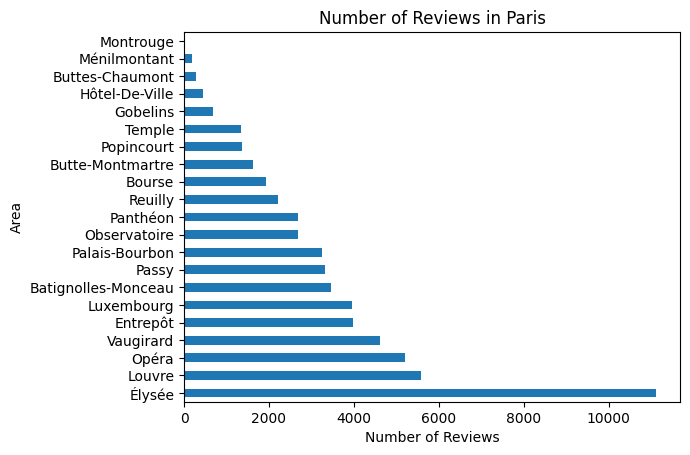

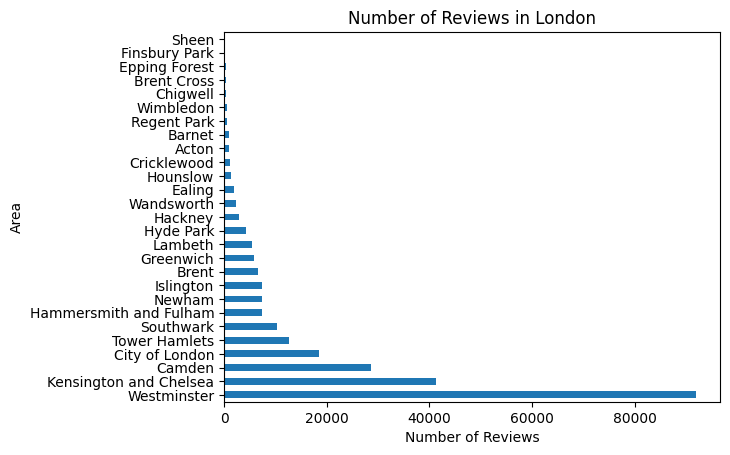

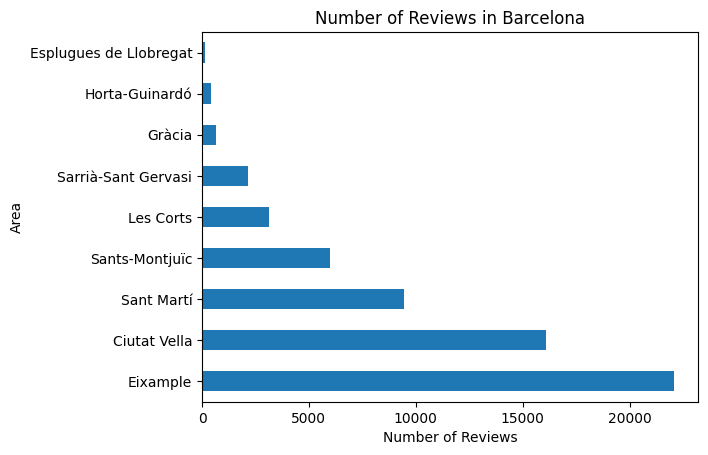

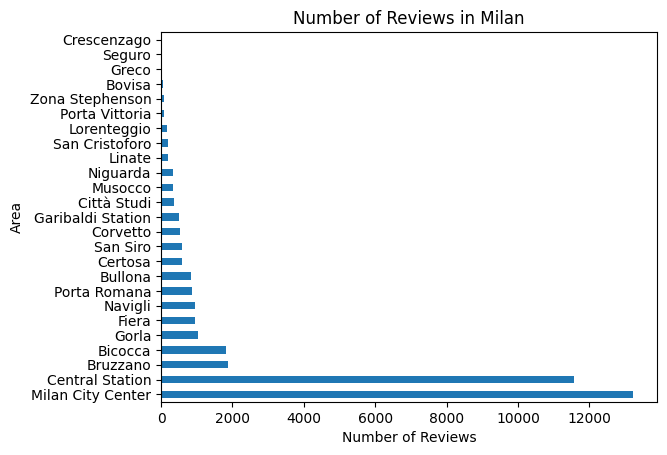

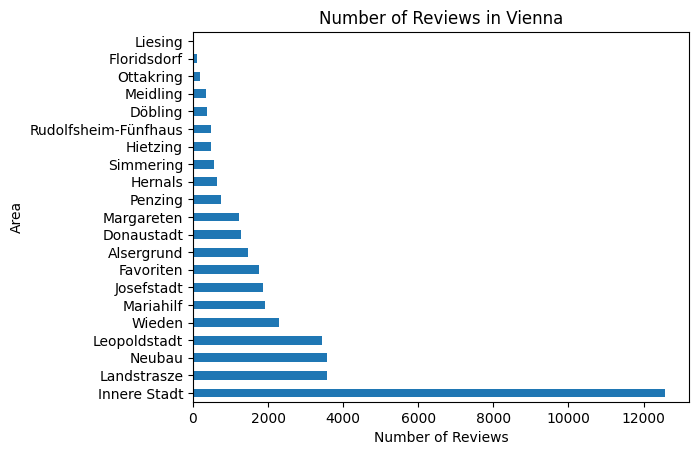

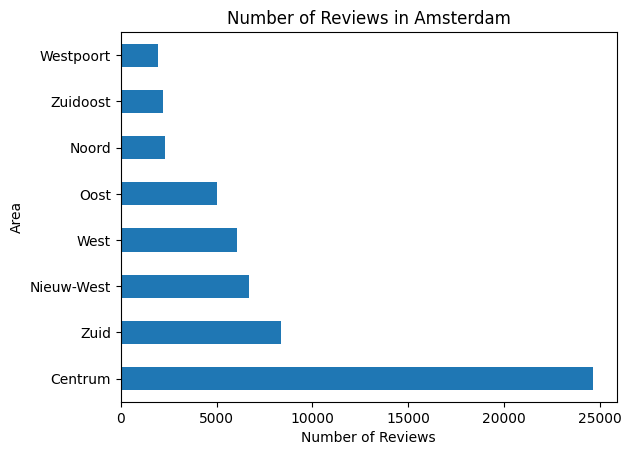

In [18]:
region_analysis()

In [19]:
def create_sankey(labels, sources, targets, values):
    import plotly.graph_objects as go

    fig = go.Figure(data=[go.Sankey(
        node = dict(
            pad = 15,
            thickness = 20,
            line = dict(color = "black", width = 0.5),
            label = labels,
            color = "blue"
        ),
        link = dict(
            source = sources,  # Indices correspond to labels
            target = targets,
            value = values
        )
    )], layout=go.Layout(height=2000, width=1400))

    return fig

def specific_data_distribution(df, city, source_col, target_col):
    import pandas as pd

    filtered_df = df[df['City'].str.contains(city)]
    grouped_df = filtered_df.groupby([source_col, target_col]).size().reset_index(name='Count')
    
    #Define source_col and target_col
    labels = pd.concat([df[source_col], df[target_col]]).unique()
    label_index_mapping = pd.Series(index=labels, data=range(len(labels)))
    
    #Index mapping
    sources = grouped_df[source_col].map(label_index_mapping)
    targets = grouped_df[target_col].map(label_index_mapping)
    
    #Parameter
    values = grouped_df['Count']
    
    return grouped_df, create_sankey(labels.tolist(), sources.tolist(), targets.tolist(), values.tolist())

def tourism_region_analysis(df, city, source_col, target_col, region):
    import pandas as pd

    grouped_df, _ = specific_data_distribution(df, city, source_col, target_col)
    
    # Filter the grouped DataFrame based on the region
    filtered_df = grouped_df[grouped_df['Region'].str.contains(region)].sort_values(by='Count', ascending=False)
    
    # Define labels, sources, targets, and values for the Sankey diagram
    labels = pd.concat([filtered_df[source_col], filtered_df[target_col]]).unique()
    label_index_mapping = pd.Series(index=labels, data=range(len(labels)))
    sources = filtered_df[source_col].map(label_index_mapping)
    targets = filtered_df[target_col].map(label_index_mapping)
    values = filtered_df['Count']

    return create_sankey(labels.tolist(), sources.tolist(), targets.tolist(), values.tolist())

Let's see the most populated area in each city.

In [20]:
tourism_region_analysis(df, 'Paris', 'Region', 'Hotel_Name', 'Élysée')

In [21]:
tourism_region_analysis(df, 'London', 'Region', 'Hotel_Name', 'Westminster')

In [22]:
tourism_region_analysis(df, 'Milan', 'Region', 'Hotel_Name', 'Milan City Center')

In [23]:
tourism_region_analysis(df, 'Vienna', 'Region', 'Hotel_Name', 'Innere Stadt')

In [24]:
tourism_region_analysis(df, 'Barcelona', 'Region', 'Hotel_Name', 'Eixample')

In [25]:
tourism_region_analysis(df, 'Amsterdam', 'Region', 'Hotel_Name', 'Centrum')

***Flow of guests for each country***

In [26]:
parisguests, _ = specific_data_distribution(df, 'Paris', 'Reviewer_Nationality', 'Region')
londonguests, _ = specific_data_distribution(df, 'London', 'Reviewer_Nationality', 'Region')
barcaguests, _ = specific_data_distribution(df, 'Barcelona', 'Reviewer_Nationality', 'Region')
milanguests, _ = specific_data_distribution(df, 'Milan', 'Reviewer_Nationality', 'Region')
viennaguests, _ = specific_data_distribution(df, 'Vienna', 'Reviewer_Nationality', 'Region')
amsterdamguests, _ = specific_data_distribution(df, 'Amsterdam', 'Reviewer_Nationality', 'Region')

Don't worry, we'll handle it at the next phase of analysis.

In [27]:
parisguests.sort_values(by = 'Count', ascending = False)

,Reviewer_Nationality,Region,Count
1931,United Kingdom,Élysée,2599
1923,United Kingdom,Opéra,1590
1930,United Kingdom,Vaugirard,1552
1915,United Kingdom,Entrepôt,1492
1918,United Kingdom,Louvre,1410
...,...,...,...
1538,Saint Barts,Louvre,1
1539,Saint Kitts and Nevis,Bourse,1
1541,Saint Kitts and Nevis,Passy,1
1542,Saint Lucia,Butte-Montmartre,1


In [28]:
londonguests.sort_values(by = 'Count', ascending = False)

,Reviewer_Nationality,Region,Count
2129,United Kingdom,Westminster,51498
2121,United Kingdom,Kensington and Chelsea,23679
2108,United Kingdom,Camden,19833
2110,United Kingdom,City of London,12956
2127,United Kingdom,Tower Hamlets,10341
...,...,...,...
1207,Macau,City of London,1
1208,Macau,Hackney,1
1210,Macau,Hyde Park,1
1211,Macau,Islington,1


In [29]:
barcaguests.sort_values(by = 'Count', ascending = False)

,Reviewer_Nationality,Region,Count
908,United Kingdom,Eixample,7000
907,United Kingdom,Ciutat Vella,5880
913,United Kingdom,Sant Martí,3908
923,United States of America,Eixample,2424
922,United States of America,Ciutat Vella,2132
...,...,...,...
659,Palestinian Territory,Gràcia,1
196,Cook Islands,Eixample,1
652,Pakistan,Horta-Guinardó,1
651,Pakistan,Gràcia,1


In [30]:
milanguests.sort_values(by = 'Count', ascending = False)

,Reviewer_Nationality,Region,Count
1576,United Kingdom,Milan City Center,2149
1565,United Kingdom,Central Station,1886
1602,United States of America,Milan City Center,1284
60,Australia,Central Station,1172
1592,United States of America,Central Station,1121
...,...,...,...
949,Moldova,Porta Romana,1
950,Moldova,Porta Vittoria,1
952,Monaco,Bruzzano,1
953,Monaco,Bullona,1


In [31]:
viennaguests.sort_values(by = 'Count', ascending = False)

,Reviewer_Nationality,Region,Count
1640,United Kingdom,Innere Stadt,2744
1663,United States of America,Innere Stadt,1360
1643,United Kingdom,Leopoldstadt,839
1648,United Kingdom,Neubau,716
86,Australia,Innere Stadt,702
...,...,...,...
811,Kenya,Alsergrund,1
813,Kenya,Hernals,1
816,Kenya,Landstrasze,1
817,Kenya,Leopoldstadt,1


In [32]:
amsterdamguests.sort_values(by = 'Count', ascending = False)

,Reviewer_Nationality,Region,Count
884,United Kingdom,Centrum,9630
885,United Kingdom,Nieuw-West,3209
890,United Kingdom,Zuid,3121
895,United States of America,Centrum,2779
888,United Kingdom,West,2704
...,...,...,...
515,Macau,Oost,1
479,Laos,Zuid,1
477,Kyrgyzstan,Oost,1
476,Kyrgyzstan,Centrum,1


I can't really help but think that the dataset is very UK-centric - The hotels are mostly UK-based, and the guests are also dominated by British. In other words, this dataset is strongly UK-biased, and not usable for all-in-one general analysis.

In [33]:
#Percentage of Reviewer_Nationality
df['Reviewer_Nationality'].value_counts()/len(df)

Reviewer_Nationality
United Kingdom              0.48
United States of America    0.07
Australia                   0.04
Ireland                     0.03
United Arab Emirates        0.02
                            ... 
Cape Verde                  0.00
Northern Mariana Islands    0.00
Tuvalu                      0.00
Guinea                      0.00
Palau                       0.00
Name: count, Length: 227, dtype: float64

That's... a disturbing number. 227 nationalities recorded, and 48% of them are British? Are you *(insert your preferred word here)* kidding me?!

***Review distribution for each region in a country***

In [34]:
parishotels, _ = specific_data_distribution(df, 'Paris', 'Region', 'Hotel_Name')
londonhotels, _ = specific_data_distribution(df, 'London', 'Region', 'Hotel_Name')
barcahotels, _ = specific_data_distribution(df, 'Barcelona', 'Region', 'Hotel_Name')
milanhotels, _ = specific_data_distribution(df, 'Milan', 'Region', 'Hotel_Name')
viennahotels, _ = specific_data_distribution(df, 'Vienna', 'Region', 'Hotel_Name')
amsterdamhotels, _ = specific_data_distribution(df, 'Amsterdam', 'Region', 'Hotel_Name')

In [35]:
parishotels.sort_values(by = 'Count', ascending = False)

,Region,Hotel_Name,Count
72,Entrepôt,Mercure Paris Terminus Nord,1459
64,Entrepôt,Holiday Inn Paris Gare de l Est,1129
14,Batignolles-Monceau,Hyatt Regency Paris Etoile,874
368,Vaugirard,Pullman Paris Tour Eiffel,846
358,Vaugirard,Mercure Paris Centre Tour Eiffel,771
...,...,...,...
73,Entrepôt,Renaissance Paris Republique Hotel Spa,13
29,Batignolles-Monceau,XO Hotel,13
400,Élysée,Hotel Daniel Paris,12
434,Élysée,Le Lavoisier,12


In [36]:
londonhotels.sort_values(by = 'Count', ascending = False)

,Region,Hotel_Name,Count
224,Tower Hamlets,Britannia International Hotel Canary Wharf,4789
345,Westminster,Strand Palace Hotel,4256
324,Westminster,Park Plaza Westminster Bridge London,4169
132,Kensington and Chelsea,Copthorne Tara Hotel London Kensington,3578
61,City of London,DoubleTree by Hilton Hotel London Tower of London,3212
...,...,...,...
248,Westminster,COMO The Halkin,29
180,Kensington and Chelsea,The Franklin Hotel Starhotels Collezione,28
240,Westminster,45 Park Lane Dorchester Collection,28
363,Westminster,The Henrietta Hotel,27


In [37]:
barcahotels.sort_values(by = 'Count', ascending = False)

,Region,Hotel_Name,Count
11,Ciutat Vella,Eurostars Grand Marina Hotel GL,1082
158,Sant Martí,Catalonia Atenas,1061
62,Eixample,Catalonia Plaza Catalunya,964
184,Sants-Montjuïc,Catalonia Barcelona Plaza,932
156,Sant Martí,Barcelona Princess,897
...,...,...,...
84,Eixample,Hotel Advance,28
26,Ciutat Vella,Hotel G tico,25
175,Sant Martí,The Level at Melia Barcelona Sky,22
195,Sarrià-Sant Gervasi,AC Hotel Irla a Marriott Lifestyle Hotel,16


In [38]:
milanhotels.sort_values(by = 'Count', ascending = False)

,Region,Hotel_Name,Count
5,Bruzzano,Hotel Da Vinci,1877
24,Central Station,Glam Milano,1335
0,Bicocca,Hotel degli Arcimboldi,1118
27,Central Station,Hotel Berna,1052
133,Milan City Center,The Square Milano Duomo,899
...,...,...,...
160,Seguro,Hotel Silver,26
57,Corvetto,MiHotel,22
91,Milan City Center,Bulgari Hotel Milano,17
59,Crescenzago,Ibis Styles Milano Palmanova,12


In [39]:
viennahotels.sort_values(by = 'Count', ascending = False)

,Region,Hotel_Name,Count
64,Innere Stadt,Hotel de France Wien,956
107,Leopoldstadt,Hotel Stefanie,884
122,Mariahilf,Leonardo Hotel Vienna,728
87,Landstrasze,Austria Trend Hotel Savoyen Vienna,713
129,Neubau,25hours Hotel beim MuseumsQuartier,689
...,...,...,...
21,Favoriten,Hilton Garden Inn Vienna South,20
127,Meidling,Gartenhotel Altmannsdorf Hotel 1,20
69,Innere Stadt,Palais Coburg Residenz,16
22,Favoriten,Hotel Eitlj rg,12


In [40]:
amsterdamhotels.sort_values(by = 'Count', ascending = False)

,Region,Hotel_Name,Count
15,Centrum,Hotel Esther a,1837
45,Nieuw-West,Best Western Premier Hotel Couture,1809
49,Nieuw-West,Ramada Apollo Amsterdam Centre,1704
68,West,Golden Tulip Amsterdam West,1686
31,Centrum,Park Plaza Victoria Amsterdam,1595
...,...,...,...
18,Centrum,Hyatt Regency Amsterdam,67
2,Centrum,Amsterdam Canal Residence,67
75,West,Pillows Anna van den Vondel Amsterdam,56
21,Centrum,InterContinental Amstel Amsterdam,34


Review distribution is all over the place as well... * *sigh* * Let's just move on to the rating distribution for each region.

In [41]:
def rating_distribution(df):
    import pandas as pd
    import plotly.express as px

    cities = ["Paris", "London", "Barcelona", "Milan", "Vienna", "Amsterdam"]
    result = []

    for city in cities:
        cities_data = df[df['City'].str.contains(city)]
        regions = cities_data['Region'].unique()

        for region in regions:
            region_data = cities_data[cities_data['Region'].str.contains(region)]
            avg_score = region_data['Reviewer_Score'].mean()
            num_reviews = len(region_data)
            avg_days_since_review = region_data['days_since_review'].mean()
            coefficient = (avg_score * num_reviews) / avg_days_since_review
            result.append({'City': city, 'Region': region, 'Average Score': avg_score, 'Number of Reviews': num_reviews, 'Average Days Since Review': avg_days_since_review, 'Validity Coefficient': coefficient})

    result_df = pd.DataFrame(result)

    # Binning
    bins = [0, 4.35, 7.20, 8.40, 9.60, 10] 
    labels = ['Abysmal', 'Unsatisfactory', 'Satisfactory', 'Distinguished', 'Excellence'] 
    result_df['Score_Category'] = pd.cut(result_df['Average Score'], bins=bins, labels=labels)

    # Visualization
    fig = px.bar(result_df.sort_values(by='Average Score', ascending=False), 
                x='Region',
                y='Average Score', 
                color='City', 
                title=f'Average Score by Region in Each City', 
                height=800, 
                width = 1280, 
                hover_data=['Number of Reviews'])

    fig.update_layout(barmode='stack', xaxis_title='Region', yaxis_title='Average Score')

    fig.show()

    return result_df

bin_df = rating_distribution(df)
bin_df.sort_values(by = 'Average Score', ascending = False)

,City,Region,Average Score,Number of Reviews,Average Days Since Review,Validity Coefficient,Score_Category
12,Paris,Hôtel-De-Ville,8.92,450,2830.42,1.42,Distinguished
28,London,Greenwich,8.89,5821,2816.57,18.37,Distinguished
3,Paris,Luxembourg,8.89,3942,2859.22,12.25,Distinguished
9,Paris,Palais-Bourbon,8.88,3254,2844.85,10.16,Distinguished
108,Amsterdam,Westpoort,8.85,1927,2823.46,6.04,Distinguished
...,...,...,...,...,...,...,...
65,Milan,Bovisa,7.14,51,2783.63,0.13,Unsatisfactory
68,Milan,San Siro,6.95,580,2751.14,1.46,Unsatisfactory
73,Milan,Lorenteggio,6.71,163,2974.09,0.37,Unsatisfactory
46,London,Chigwell,6.57,463,2856.50,1.06,Unsatisfactory


Now, we can take decisions here:

1. Should we take the data as-is?

2. Should we cut the data, based on its' validity coefficient? If so, we need to define a threshold to do so. (Note: This is a coefficient I made up with `Average Score` * `Number of Reviews` / `Average Days Since Review` - Nothing fancy or anything, it's just bigger number hopefully means more validity. Perhaps a mathematician can help me out to create better coefficient?)

In my perspective, there has to be a third way. Yes, we should take every single data, but no, we won't take it as it is. As I outlined at the beginning of this notebook, I want to extract cultural perspectives from every `Reviewer_Nationality`, so throwing away the data won't help the cause. However, if the system gives recommendation to its' users without any caveat, it won't reflect the recent reality in that particular region/hotel, resulting in wrong recommendation and judgement error from the user. This old dataset is a very good example of why caveats are very important in recommendation system.

So here's my third way. I will analyze every single bit of data, but the LLM agent has to consider this validity coefficient. Caveats brings awareness from the user - which might result in that particular user's taking the system's recommendation with a truckload of salt - But the point is to help every user make informed decision, and that is the role this system seeks to fill in for its' users. For hoteliers, though, not so much.

Another idea that I can bring up here is to create 'dynamic' data. ***Validity coefficient*** was created with three dynamic data, namely `Average Score` (based on `Reviewer_Score` for a hotel in a particular region at a time), `Number of Reviews` (which basically is the total number of data, also at a single time), and `Average Days Since Review` (time-based data in and of itself). This means ***validity coefficient*** will always change in every update, enabling the LLM agent with a sense of data validity.

In [2]:
df[['Negative_Review']].loc[[0, 364907]]

,Negative_Review
0,I am so angry that i made this post available via all possible sites i use when planing my trips so no one will make the mistake of booking this place I made my booking via booking com We stayed for 6 nights in this hotel from 11 to 17 July Upon arrival we were placed in a small room on the 2nd floor of the hotel It turned out that this was not the room we booked I had specially reserved the 2 level duplex room so that we would have a big windows and high ceilings The room itself was ok if you don t mind the broken window that can not be closed hello rain and a mini fridge that contained some sort of a bio weapon at least i guessed so by the smell of it I intimately asked to change the room and after explaining 2 times that i booked a duplex btw it costs the same as a simple double but got way more volume due to the high ceiling was offered a room but only the next day SO i had to check out the next day before 11 o clock in order to get the room i waned to Not the best way to begin your holiday So we had to wait till 13 00 in order to check in my new room what a wonderful waist of my time The room 023 i got was just as i wanted to peaceful internal garden view big window We were tired from waiting the room so we placed our belongings and rushed to the city In the evening it turned out that there was a constant noise in the room i guess it was made by vibrating vent tubes or something it was constant and annoying as hell AND it did not stop even at 2 am making it hard to fall asleep for me and my wife I have an audio recording that i can not attach here but if you want i can send it via e mail The next day the technician came but was not able to determine the cause of the disturbing sound so i was offered to change the room once again the hotel was fully booked and they had only 1 room left the one that was smaller but seems newer
364907,We are customers of this Hotel since a long time The Hotel is beeing rebuilted They should inform about this Very noisy by the morning Carpets in loby VERY DIRTY Rooms in poor state of maintenance damaged furniture broken toilet ripped Wall paper in the rooms etc They told us how everything will change not worth any improvement So they have two alternatives Close the Hotel during the works Request price compatible with the quality offered When we suggest to a high hotel responsible to close the Hotel during the works and make them quickly we were informed that it was impossible because the true business of the Hotel were the conferences meetings etc and not the rental room UNBELIEVABLE Is anacceptable that have increased the cost of breakfast and decreased quality 17 5 by such breakfast I consider it an assault WE NEVER BE BACK TO THIS HOTEL


In [3]:
df[['Positive_Review']].loc[[364907]]

,Positive_Review
364907,Unicamente da simpatia do pessoal


Hey, a non-english review!

### A note for critical studies audience

See what I did there? This is the heart of HotelWatch system: The top part of the equation, which essentially makes the "validity number" grows bigger, consists of number of reviews and average score. In order to create a 'good enough' validity, hotels need to get more reviews with good scores to meet certain threshold. However, at the bottom part of the equation lies the review's "age", where that number is eventually decayed as time progresses.

This system encourage a lot of (constant) good reviews, which aligns with the hotelier's rationality, but business always cut corners. Promos, discounts, compliments, and any other means in exchange of good reviews were, and still are, deployed by hoteliers to create a gamification of reviews, which dilutes the usefulness (read: existence) of this system. "Exchange" (see Bourdieu's "Debts and Gifts" in his Logic of Practice) is the word that fully describes the problem of this system; Or, for other parties, exploit this exchange (a trade-off, if you wish) as means for their own ends. One good example is a guest's means of anger to highlight hoteliers' fatal mistake that cause embarassment, hurt, or other wrongdoing for this particular guest, and wish to point that out for other guests as an exposé. Another might use a review as leverage for compliments, or any other means of conflict necessary to achieve one's goal.

Ultimately, this system serves as a "battleground of truth". Sure, there's no such thing as "one truth prevails" (looking at you, Detective Conan!) since everything is a social construct, but the model needs to be aware of social construct as disciplinary means. I gave you two examples above to raise a case-and-point for this matter, as well as another three below about this gamification.

In [4]:
df[['Positive_Review']].loc[[38967, 29895, 498685]]

,Positive_Review
38967,When we checked in got free upgrade to Executive suite
29895,Fantastic location good size room with kingsize bed Very friendly staff we got free drinks vouchers when our room wasn t ready and a change of room so we didn t even have to wait I d definately recommend this hotel
498685,We were on our honeymoon and got free upgrade to apartment Very friendly staff Great location Great link between airport


This is a red flag in my book, but different company will look at it in different way.

## Review Analysis

1. This dataset has a very strong bias on United Kingdom basically everywhere; Number of guests, hotels, regions, even to the number of reviews. In other words, it necessitates us to conduct a specific analysis (not a general one).

2. The dataset is also archaic, but not unusable in this front. For HotelWatch, it keeps a tally of complaints and compliments, highlighting a specific problems or strengths in specific hotel/region. For Hotel Recommender System, this might not relevant from the guest's time perspective (recency bias), but noting a legacy (both good and bad) of hotels lends some credence for informed decision making.

3. There is one (there might be more) non-English review in this dataset. Since the review analysis will be conducted in Bag-of-Words manner (meaning, the occurence of a word or two in specific domains, either in the whole dataframe or in particular region), these non-English words won't be considered since its' occurence are below the threshold.

With that out of the way, onward to the review analysis!

***General Review Analysis***

In [45]:
def generate_wordcloud(reviews):
    import matplotlib.pyplot as plt
    from wordcloud import WordCloud

    wordcloud = WordCloud(width=800, height=800, background_color='white', stopwords=None, min_font_size=10).generate(' '.join(reviews))
    plt.figure(figsize=(8, 8), facecolor=None)
    plt.imshow(wordcloud)
    plt.title(f'Wordcloud', fontsize=20)
    plt.axis("off")
    plt.tight_layout(pad=0)
    plt.show()

def generate_wordclouds(columns):
    for column in columns:
        reviews = df[column].explode().dropna().tolist()
        print(f"Wordcloud for {column}:")
        generate_wordcloud(reviews)

Wordcloud for Positive_Review:


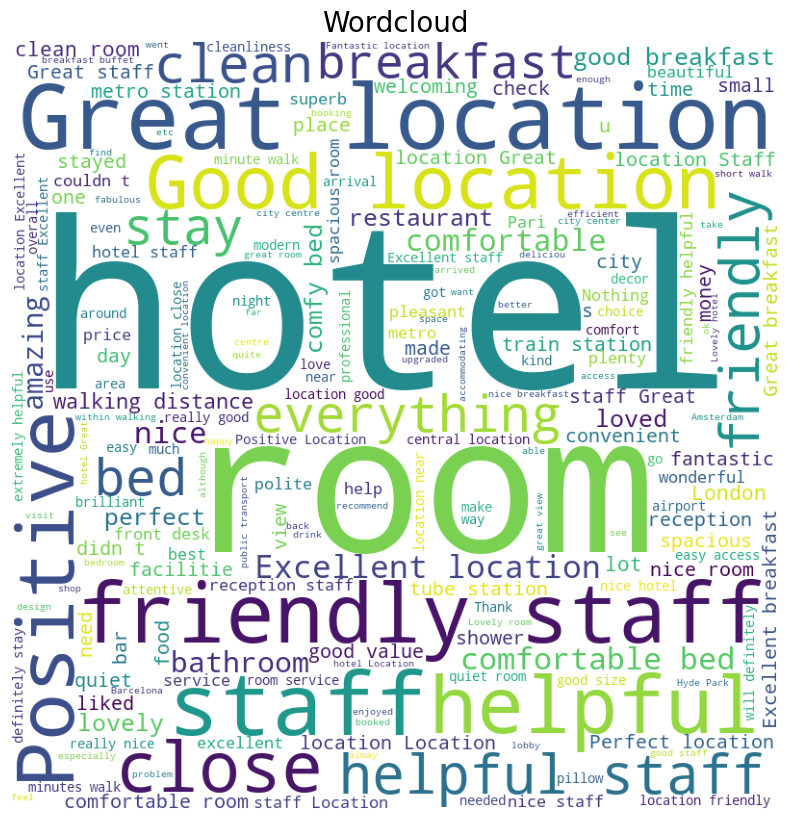

Wordcloud for Negative_Review:


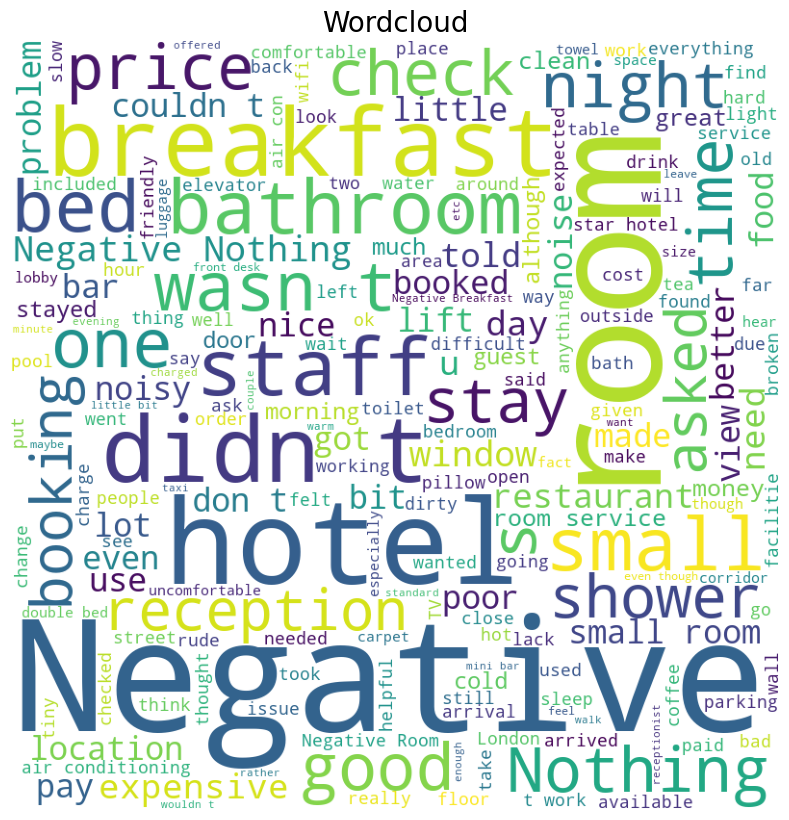

Wordcloud for Tags:


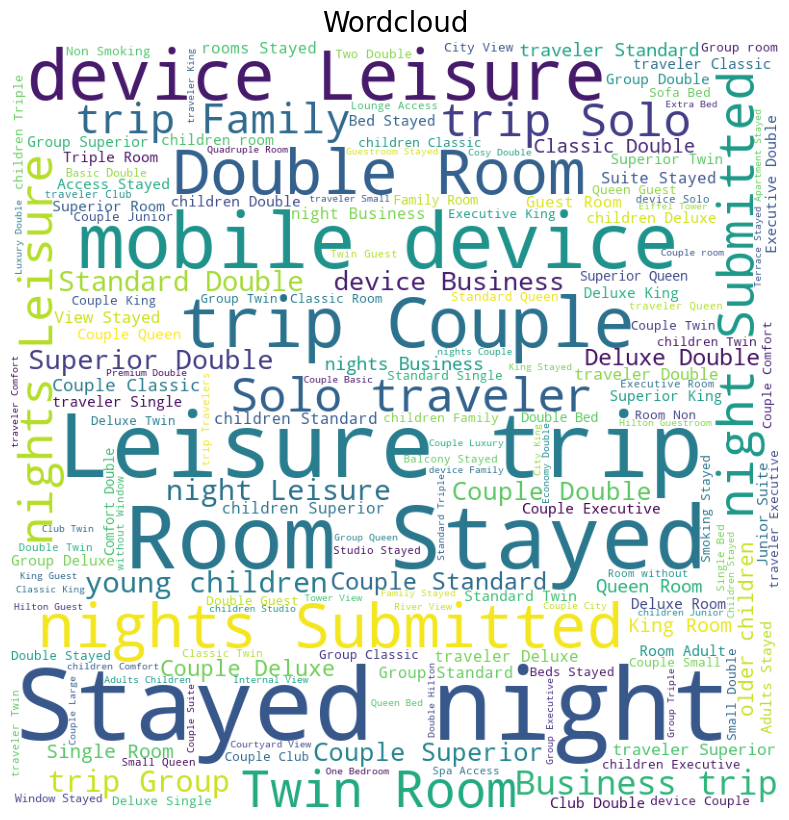

In [46]:
generate_wordclouds(['Positive_Review', 'Negative_Review', 'Tags'])

***Regional Review Analysis***

In [50]:
def rearrange_dataset(df):
    df = df.explode('Tags').dropna()

    dataset = df.groupby(['City', 'Region', 'Hotel_Name', 'Reviewer_Nationality', 'Score_Category', 'Reviewer_Score', 'days_since_review', 'Positive_Review', 'Negative_Review'], observed=True)['Tags'].sum().to_frame()

    return dataset

dataset = rearrange_dataset(df)
dataset

Tags
City      Region  Hotel_Name                        Reviewer_Nationality      Score_Category Reviewer_Score days_since_review Positive_Review                                                                                      Negative_Review                                                                                                                                                                                          
Amsterdam Centrum Albus Hotel Amsterdam City Centre Australia                 Unsatisfactory 5.80           2504              Not really anything                                                                                   Room was way too small Noisy Not an enjoyable stay                                                                                   [' Leisure trip ', ' Couple ', ' Double Room ', ' Stayed 1 night ']
                                                                                             7.10           2549              The decor and the bathroom                                                                            3pm check in                                                                                         [' Leisure trip ', ' Couple ', ' Superior Double Room ', ' Stayed 1 night ', ' Submitted from a ...
                                                                              Satisfactory   7.90           2522              Location and very clean                                                                               No fridge                                                                                            [' Leisure trip ', ' Couple ', ' Superior Double Room ', ' Stayed 2 nights ', ' Submitted from a...
                                                                                                            2951              Great location with helpful staff                                                                     Our room was quite dark                                                                                                             [' Leisure trip ', ' Couple ', ' Double Room ', ' Stayed 4 nights ']
                                                                                             8.30           3196              Location Staff Price Free internet                                                                    Nothing                                                                                                                    [' Leisure trip ', ' Couple ', ' Superior Double Room ', ' Stayed 2 nights ']
...                                                                                                                                                                                                                                                                                                                                                                                                                                      ...
Vienna    Wieden  Suite Hotel 900 m zur Oper        United States of America  Excellence     10.00          2597              The proximity of the metro made it so easy to get everywhere The staff were very helpful There is... No Negative                                                                                                                  [' Business trip ', ' Solo traveler ', ' Double Room ', ' Stayed 5 nights ']
                                                                                                            2887              The apartment was clean equipped with 2 air conditioners and was a great place to explore Vienna ...  Room service was always early evening when we had already been gone for the day and resting befo...  [' Leisure trip ', ' Couple ', ' Congress Suite ', ' Stayed 6 nights ', ' Submitted from a mobil...
                                                                                                            3098              it was a